<a href="https://colab.research.google.com/github/ejazfahil/Hardware-and-software-project/blob/main/FSF_electric_motor_temperature.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('../input/electric-motor-temperature/measures_v2.csv')
df.head(10)

FileNotFoundError: [Errno 2] No such file or directory: '../input/electric-motor-temperature/measures_v2.csv'

In [ ]:
df.describe().T

NameError: name 'df' is not defined

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1330816 entries, 0 to 1330815
Data columns (total 13 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   u_q             1330816 non-null  float64
 1   coolant         1330816 non-null  float64
 2   stator_winding  1330816 non-null  float64
 3   u_d             1330816 non-null  float64
 4   stator_tooth    1330816 non-null  float64
 5   motor_speed     1330816 non-null  float64
 6   i_d             1330816 non-null  float64
 7   i_q             1330816 non-null  float64
 8   pm              1330816 non-null  float64
 9   stator_yoke     1330816 non-null  float64
 10  ambient         1330816 non-null  float64
 11  torque          1330816 non-null  float64
 12  profile_id      1330816 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 132.0 MB


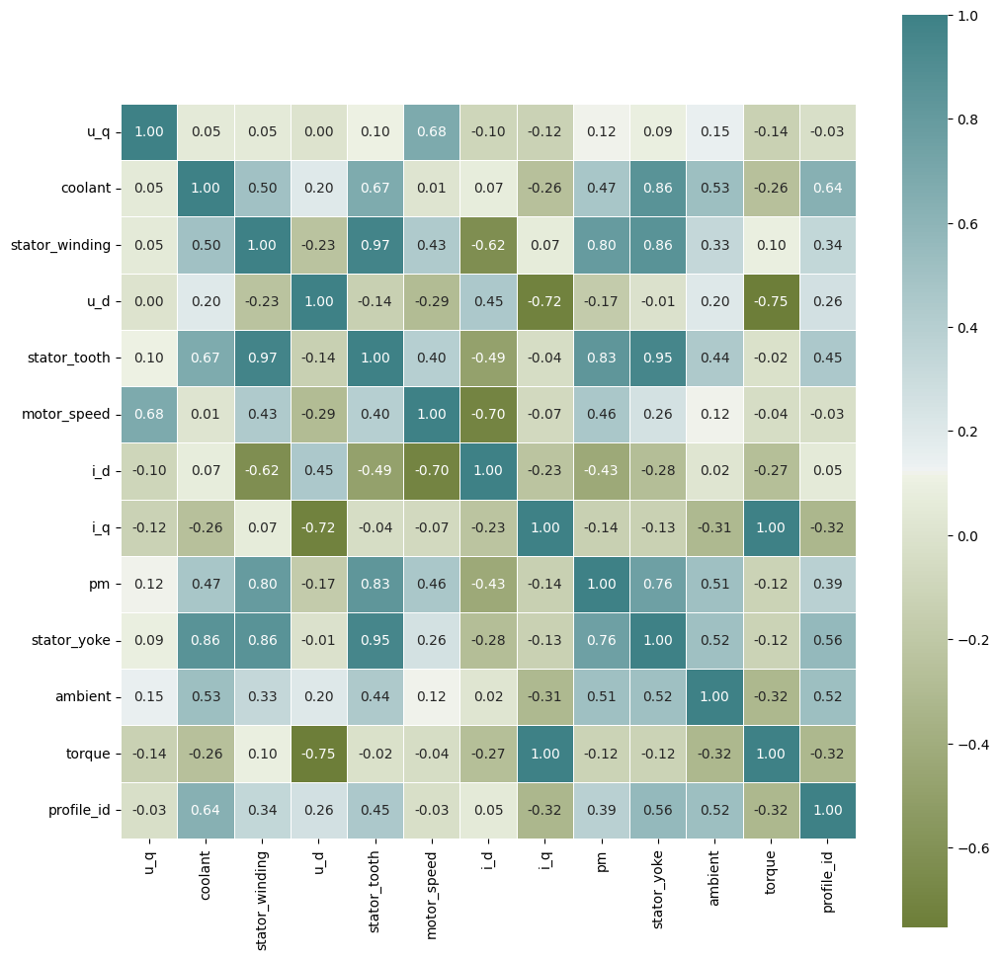

In [ ]:
f,ax=plt.subplots(figsize=(12,12))
corr=df.corr()

sns.heatmap(corr, annot=True, linewidths=.5, fmt='.2f',
            mask= np.zeros_like(corr,dtype=bool),
            cmap=sns.diverging_palette(100,200,as_cmap=True),
            square=True, ax=ax)

plt.show()


In [ ]:
'''
for x in sorted(df.profile_id.unique()):

    df2 = df[df['profile_id'] == x]
    correlation_matrix = df2.corr()

    f,ax=plt.subplots(figsize=(12,12))

    sns.heatmap(correlation_matrix, annot=True, linewidths=.5, fmt='.2f',
            mask= np.zeros_like(corr,dtype=bool),
            cmap=sns.diverging_palette(100,200,as_cmap=True),
            square=True, ax=ax)
    plt.title(f"Correlation Matrix for profile_id {x}")
    plt.show()
    '''


'\nfor x in sorted(df.profile_id.unique()):\n    \n    df2 = df[df[\'profile_id\'] == x]\n    correlation_matrix = df2.corr()\n    \n    f,ax=plt.subplots(figsize=(12,12))\n\n    sns.heatmap(correlation_matrix, annot=True, linewidths=.5, fmt=\'.2f\', \n            mask= np.zeros_like(corr,dtype=bool), \n            cmap=sns.diverging_palette(100,200,as_cmap=True), \n            square=True, ax=ax)\n    plt.title(f"Correlation Matrix for profile_id {x}")\n    plt.show()\n    '

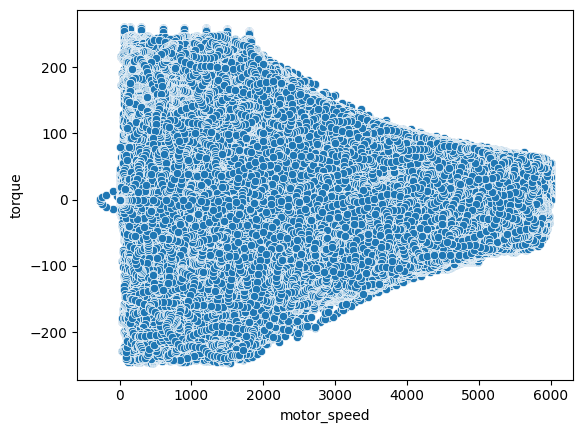

In [ ]:
sns.scatterplot(x='motor_speed', y='torque', data=df)
plt.show()

In [ ]:
'''
sns.pairplot(df, dropna = 'true')
plt.show()
'''

"\nsns.pairplot(df, dropna = 'true')\nplt.show()\n"

In [ ]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [ ]:
X = df.drop(['pm','profile_id'], axis = 1)
y = df['pm']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [ ]:
method = SelectKBest(score_func= mutual_info_regression, k = 'all')

method.fit_transform(X_train, y_train)

array([[ 1.20716524e+01,  1.87682610e+01,  1.98506203e+01, ...,
         1.95829220e+01,  2.31783772e+01,  1.37207493e-01],
       [ 1.22371705e+02,  3.20751657e+01,  6.17527679e+01, ...,
         4.18507624e+01,  2.63845322e+01, -9.80471685e+00],
       [ 6.31712570e+01,  1.84688244e+01,  4.58625603e+01, ...,
         3.12640781e+01,  1.98566170e+01,  1.02923241e+02],
       ...,
       [ 3.18399934e+01,  5.44167581e+01,  1.02315358e+02, ...,
         7.54414793e+01,  2.79766677e+01, -1.37712256e+02],
       [ 9.46150284e+01,  1.88181801e+01,  3.68397903e+01, ...,
         3.03713970e+01,  2.38784409e+01, -4.38721001e-01],
       [-1.08764446e+00,  1.82474785e+01,  2.00672760e+01, ...,
         1.98258038e+01,  2.58267460e+01,  5.55261803e+00]])

In [ ]:
correlation_matrix = X_train.corr(method= 'pearson').abs()
print(correlation_matrix)

                     u_q   coolant  stator_winding       u_d  stator_tooth  \
u_q             1.000000  0.052502        0.051936  0.004780      0.105780   
coolant         0.052502  1.000000        0.504778  0.195438      0.674899   
stator_winding  0.051936  0.504778        1.000000  0.235465      0.970133   
u_d             0.004780  0.195438        0.235465  1.000000      0.143110   
stator_tooth    0.105780  0.674899        0.970133  0.143110      1.000000   
motor_speed     0.683689  0.012626        0.433084  0.288559      0.399537   
i_d             0.100664  0.074692        0.624557  0.448920      0.487184   
i_q             0.125107  0.256043        0.066355  0.723055      0.041821   
stator_yoke     0.092328  0.860729        0.860269  0.008364      0.953111   
ambient         0.150989  0.525567        0.332463  0.204520      0.442837   
torque          0.136731  0.257637        0.096221  0.753740      0.017968   

                motor_speed       i_d       i_q  stator_yoke   

<Axes: >

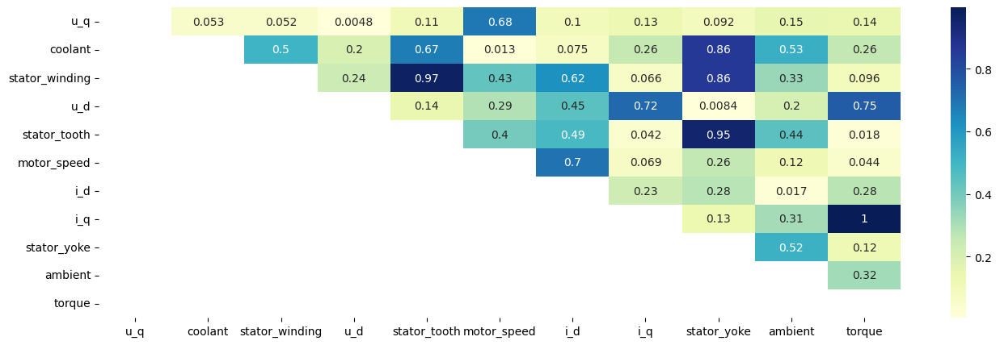

In [ ]:
upper_corr_matrix = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

plt.figure(figsize=(16,5))
sns.heatmap(data = upper_corr_matrix , cmap= 'YlGnBu', annot= True)

In [ ]:
to_filter = [column for column in upper_corr_matrix.columns if any (upper_corr_matrix[column] > 0.70)]
to_filter

['stator_tooth', 'i_d', 'i_q', 'stator_yoke', 'torque']

In [ ]:
X_new = X_train[to_filter]

In [ ]:
lr = LinearRegression()
lr.fit(X_new, y_train)

LinearRegression()

In [ ]:
y_pred = lr.predict(X_test[to_filter])

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print('Mean squared error:', mse)
print('R2 score:', r2)

Mean squared error: 96.10382779517002
R2 score: 0.7339023540010408


In [ ]:
import plotly.express as px

fig = px.scatter(x=y_test, y=y_pred)
fig.update_layout(
    xaxis_title="True Temp",
    yaxis_title="Predicted Temp",
    title="True vs. Predicted Temp Values"
)
fig.show()

Now Lets try decision tree regressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor

dt_reg = DecisionTreeRegressor()
dt_reg.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = dt_reg.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.7240190328792928


In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [3, 5],
    'min_samples_split': [2],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

best_model = grid_search.best_estimator_

y_pred2 = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best Hyperparameters: {'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2}
Mean Squared Error: 0.7240190328792928


In [ ]:
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

sequence_length = 10
X_sequences = []
y_sequences = []

for i in range(len(X_scaled) - sequence_length):
    X_sequences.append(X_scaled[i:i+sequence_length])
    y_sequences.append(y[i+sequence_length])

X_sequences = np.array(X_sequences)
y_sequences = np.array(y_sequences)

X_train, X_test, y_train, y_test = train_test_split(X_sequences, y_sequences, test_size=0.2, random_state=42)

model = Sequential([
    LSTM(64, input_shape=(sequence_length, X_train.shape[2])),
    Dense(1)
])

model.compile(loss='mean_squared_error', optimizer='adam')

model.fit(X_train, y_train, epochs=3, batch_size=32, validation_split=0.2)

mse = model.evaluate(X_test, y_test)
print("Mean Squared Error:", mse)


2024-03-13 13:35:02.462816: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-13 13:35:02.462914: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-13 13:35:02.590942: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Epoch 1/3
26617/26617 ━━━━━━━━━━━━━━━━━━━━ 91s 3ms/step - loss: 239.1810 - val_loss: 16.3344
Epoch 2/3
26617/26617 ━━━━━━━━━━━━━━━━━━━━ 140s 3ms/step - loss: 16.0532 - val_loss: 12.7870
Epoch 3/3
26617/26617 ━━━━━━━━━━━━━━━━━━━━ 90s 3ms/step - loss: 11.9379 - val_loss: 10.6419
8318/8318 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step - loss: 10.8463
Mean Squared Error: 10.778332710266113


8318/8318 ━━━━━━━━━━━━━━━━━━━━ 11s 1ms/step


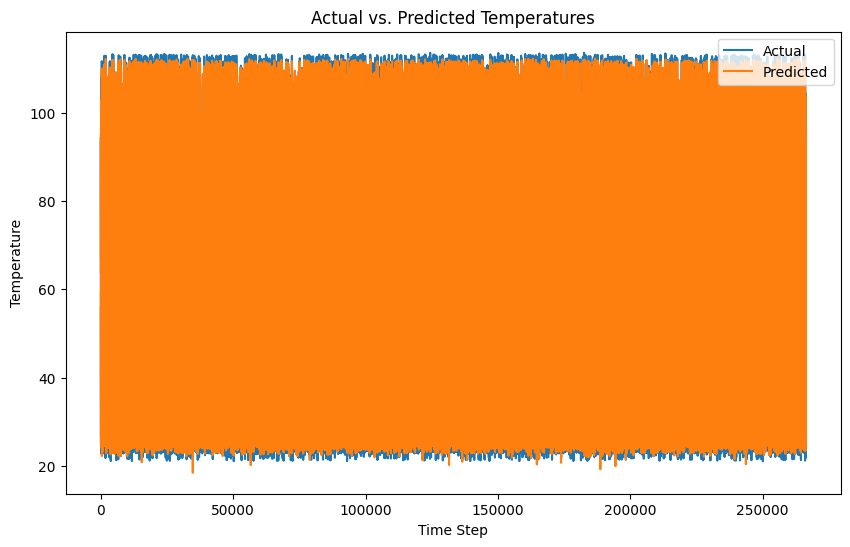

In [ ]:
y_pred = model.predict(X_test)

plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.xlabel('Time Step')
plt.ylabel('Temperature')
plt.title('Actual vs. Predicted Temperatures')
plt.legend()
plt.show()